# Konkan Canara - GRU + Residual U-Net Hybrid Model for Total Precipitation Prediction (8-Step Input Sequence)

In [1]:
# Importing the required libraries
import numpy as np
import joblib
import importlib
import KC_Data_Preprocessing as KCD
    
import random
from datetime import datetime
import gc

import torch
import Baseline_Model_Definitions as BMD
import UNet_Model_Definitions as UMD
import Base_Test as BT
import Test_Plot_Codes as TPC

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed_all(42)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = True

In [4]:
torch.cuda.init()

In [5]:
gc.collect()
torch.cuda.empty_cache()

## Data Loading and Preprocessing

In [6]:
importlib.reload(KCD);

In [7]:
feature_scaler = joblib.load('feature_scaler_tp.pkl')
target_scaler = joblib.load('target_scaler_tp.pkl')

SEQ_LEN = 8

data = KCD.prepare_konkan_data(
    file_path='KC_6H_2001-2025_Final.csv', 
    feature_scaler=feature_scaler, 
    target_scaler=target_scaler, 
    seq_len=SEQ_LEN, 
    target_variable='tp'
)

X_test, y_test = data['test']

height = data['meta']['height']
width = data['meta']['width']
num_channels = data['meta']['channels'] 
feature_names = data['meta']['feature_names']

print(f'X_test shape: {X_test.shape} (2021-2025)')

X_test shape: (7304, 8, 32, 12, 8) (2021-2025)


In [8]:
START_DATE = datetime(2001, 1, 1, 0, 0)
VAL_START_DATE = datetime(2019, 1, 1, 0, 0)
TEST_START_DATE = datetime(2021, 1, 1, 0, 0)

val_grid_idx = int((VAL_START_DATE - START_DATE).total_seconds() / (3600 * 6))
test_grid_idx = int((TEST_START_DATE - START_DATE).total_seconds() / (3600 * 6))

val_split = val_grid_idx - SEQ_LEN
test_split = test_grid_idx - SEQ_LEN
timestep_test_start = test_grid_idx

print(f'Test Start Index: {test_grid_idx}')

Test Start Index: 29220


In [9]:
feature_names

['msl', 'sst', 'u10', 'v10', 'ws', 't2m', 'rh', 'tp']

In [10]:
height, width, num_channels

(32, 12, 8)

In [11]:
X_test_gru = X_test.reshape(X_test.shape[0], X_test.shape[1], -1) 
y_test_flat = y_test.reshape(y_test.shape[0], -1)

print(f'--- GRU Input Shapes ---')
print(f'Test: X={X_test_gru.shape}, y={y_test_flat.shape}')

--- GRU Input Shapes ---
Test: X=(7304, 8, 3072), y=(7304, 384)


## Loading the trained models

In [12]:
importlib.reload(BMD);
importlib.reload(UMD);

In [13]:
GRU_MODEL_PATH = 'GRU_8S_TP.pth'

INPUT_SIZE_GRU = num_channels * height * width  
HIDDEN_SIZES = [16]
OUTPUT_SIZE_GRU = height * width

gru_model = BMD.GRUModel(
    input_features=INPUT_SIZE_GRU,
    hidden_sizes=HIDDEN_SIZES,
    output_size=OUTPUT_SIZE_GRU
).to(device)

try:
    gru_model.load_state_dict(torch.load(GRU_MODEL_PATH, map_location=device, weights_only=True))
    gru_model.eval()
    print('PyTorch GRU model loaded successfully.')
except Exception as e:
    print(f'Error loading PyTorch GRU model: {e}')

PyTorch GRU model loaded successfully.


In [14]:
INPUT_CHANNELS_UNET = num_channels + 1
OUTPUT_CHANNELS_UNET = 2

In [15]:
UNET_MODEL_PATH = 'GRU_Residual_U-Net_Hybrid_TP_8S.pth'
hybrid_model = UMD.Residual_UNet(n_channels=INPUT_CHANNELS_UNET, n_out=OUTPUT_CHANNELS_UNET)
try:
    state_dict = torch.load(UNET_MODEL_PATH, map_location=device)
    new_state_dict = {k.replace('_orig_mod.', ''): v for k, v in state_dict.items()}
    hybrid_model.load_state_dict(new_state_dict)
    hybrid_model.to(device)
    hybrid_model.eval()
    print('Residual U-Net model loaded successfully.')
except Exception as e:
    print(f'Error loading Residual U-Net: {e}')

Residual U-Net model loaded successfully.


## Testing the model on the test set and evaluating performance

In [16]:
importlib.reload(BT);

### Generating predictions for each horizon and storing results

In [17]:
MAX_HORIZON = 12
BATCH_SIZE_EVAL = 128
TARGET='tp'
num_eval_samples = len(X_test) - MAX_HORIZON

In [18]:
torch.cuda.empty_cache()

In [19]:
predictions_by_horizon, base_recursive_by_horizon, ground_truth_by_horizon, sigmas_by_horizon = BT.evaluate_recursive_forecast_store(
    bs_model=gru_model,
    hybrid_model=hybrid_model, 
    X_test=X_test, 
    y_test=y_test, 
    num_eval_samples=num_eval_samples,
    MAX_HORIZON=MAX_HORIZON,
    SEQ_LEN=SEQ_LEN,
    height=height,
    width=width,
    target_var=TARGET,
    feature_names=feature_names,
    device=device,
    BATCH_SIZE_EVAL=BATCH_SIZE_EVAL
)

In [20]:
lat_min, lat_max = data['meta']['lat_range']
lon_min, lon_max = data['meta']['lon_range']

unique_lats = np.linspace(lat_max, lat_min, height) 
unique_lons = np.linspace(lon_min, lon_max, width)

ytick_labels = [f'{y:.2f}' for y in unique_lats]
xtick_labels = [f'{x:.2f}' for x in unique_lons]

### Spatial Distribution of Metrics

In [21]:
importlib.reload(TPC);

#### RMSE

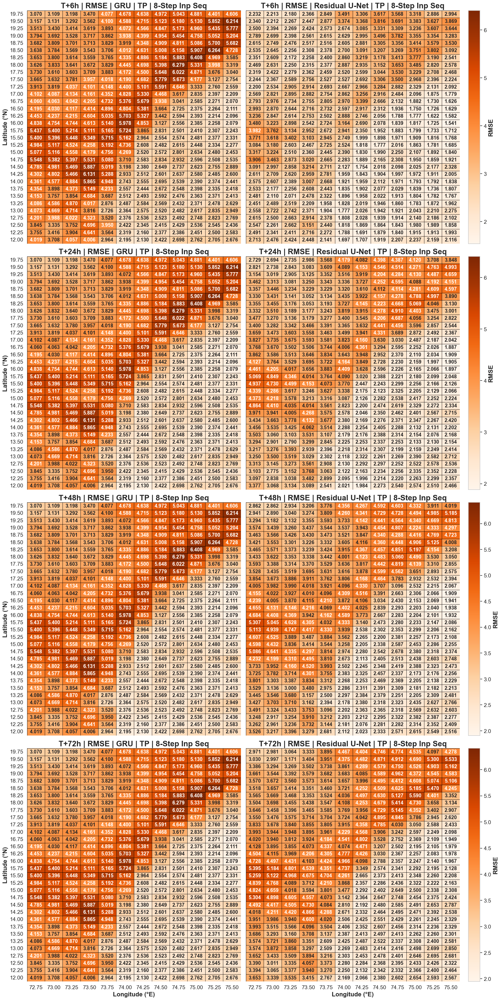

In [22]:
TPC.plot_rmse_comparison(
    h_indices=[1, 4, 8, 12],
    seq_len=SEQ_LEN,
    predictions_by_horizon=predictions_by_horizon,
    base_recursive_by_horizon=base_recursive_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    sigmas_by_horizon=sigmas_by_horizon,
    meta=data['meta'],
    height=height,
    width=width,
    bs_md='GRU',
    unet_type='Residual',
    vn='TP',
    var_name='Total Precipitation',
    target_scaler=target_scaler,
    filepath='GRU_Residual_TP_RMSE_6,24,48,72h_8S.pdf'
)

#### ACC

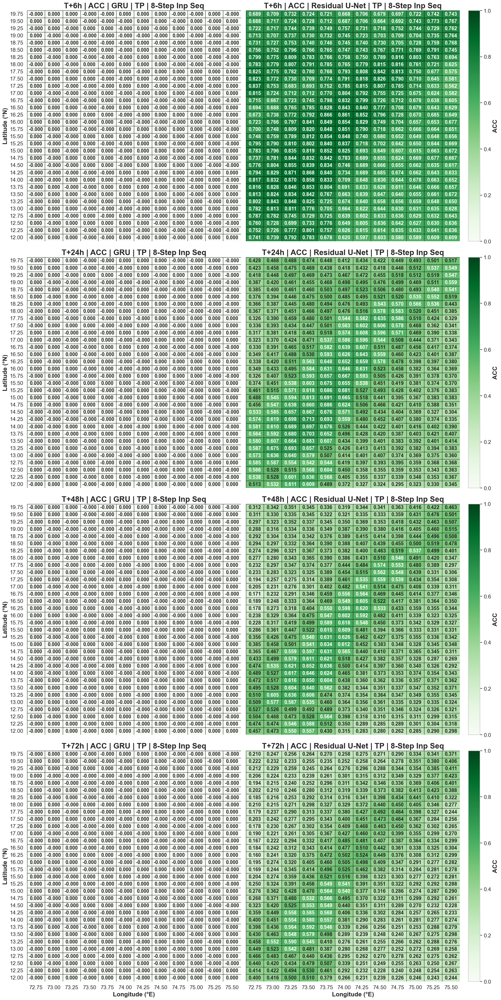

In [23]:
TPC.plot_acc_comparison(
    h_indices=[1, 4, 8, 12],
    seq_len=SEQ_LEN,
    predictions_by_horizon=predictions_by_horizon,
    base_recursive_by_horizon=base_recursive_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    sigmas_by_horizon=sigmas_by_horizon,
    meta=data['meta'],
    height=height,
    width=width,
    bs_md='GRU',
    unet_type='Residual',
    vn='TP',
    var_name='Total Precipitation',
    target_scaler=target_scaler,
    filepath='GRU_Residual_TP_ACC_6,24,48,72h_8S.pdf'
)

#### CRPS

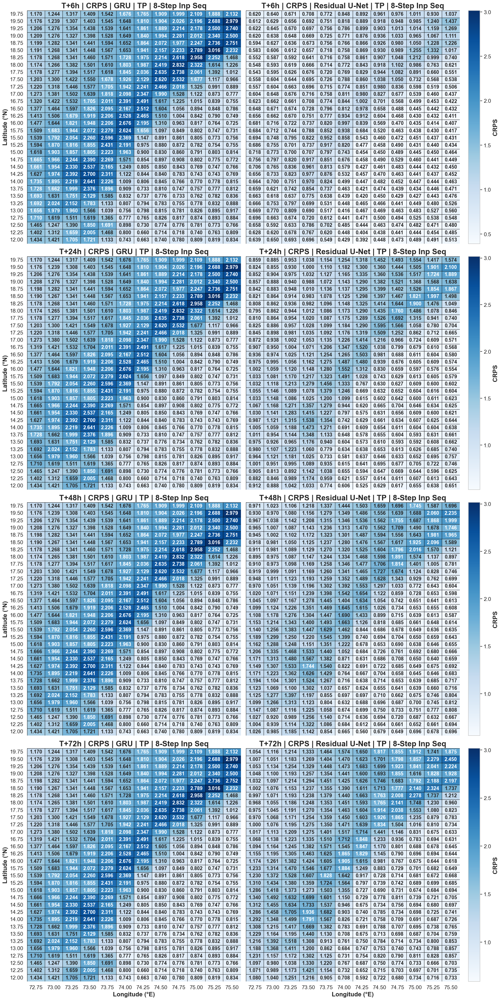

In [24]:
TPC.plot_crps_comparison(
    h_indices=[1, 4, 8, 12],
    seq_len=SEQ_LEN,
    predictions_by_horizon=predictions_by_horizon,
    base_recursive_by_horizon=base_recursive_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    sigmas_by_horizon=sigmas_by_horizon,
    meta=data['meta'],
    height=height,
    width=width,
    bs_md='GRU',
    unet_type='Residual',
    vn='TP',
    var_name='Total Precipitation',
    target_scaler=target_scaler,
    filepath='GRU_Residual_TP_CRPS_6,24,48,72h_8S.pdf'
)

### Monthly Performance Analysis

In [25]:
importlib.reload(TPC);

#### RMSE

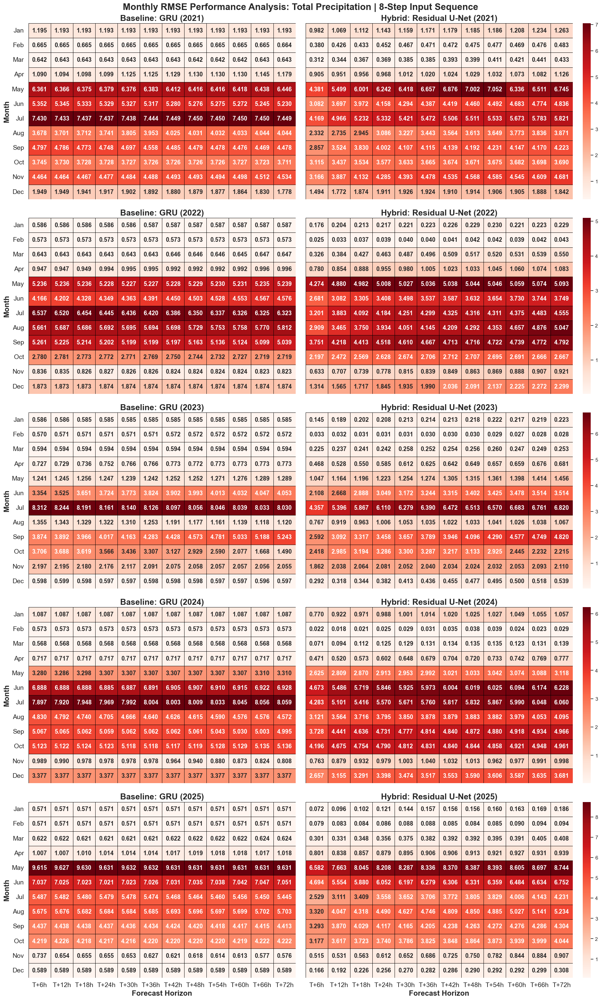

In [26]:
TPC.plot_rmse_comparison_grids(
    predictions_by_horizon=predictions_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    X_test=X_test,
    baseline_model=gru_model,
    target_scaler=target_scaler,
    num_eval_samples=num_eval_samples,
    max_horizon=MAX_HORIZON,
    start_dt = datetime(2021, 1, 1),
    bs_md='GRU',
    unet_type='Residual',
    seq_len=SEQ_LEN,
    var_name='Total Precipitation',
    filepath='GRU_Residual_TP_RMSE_Monthly_8S.pdf'
)

#### ACC

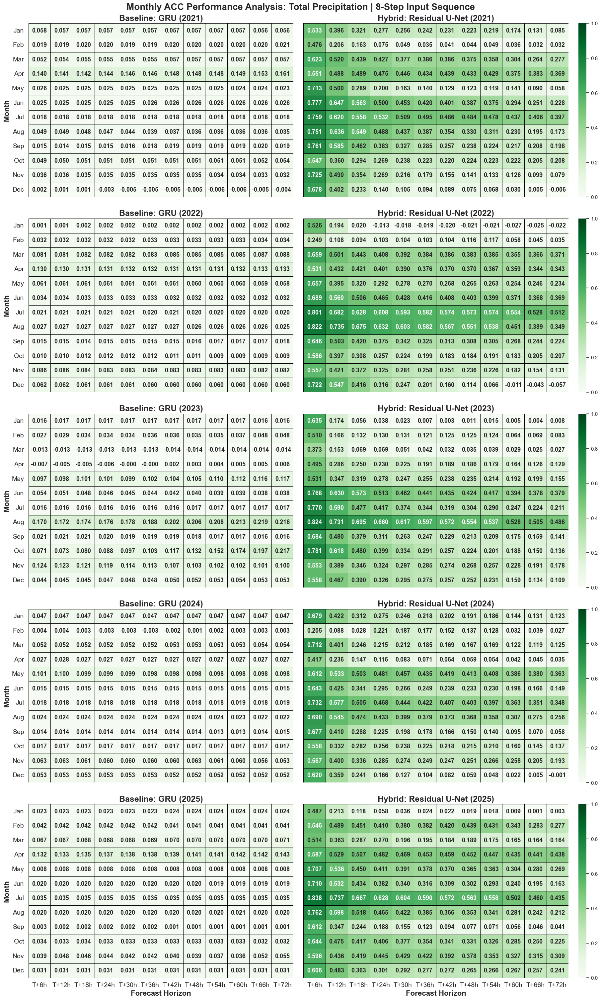

In [27]:
TPC.plot_acc_comparison_grids(
    predictions_by_horizon=predictions_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    X_test=X_test,
    baseline_model=gru_model,
    target_scaler=target_scaler,
    num_eval_samples=num_eval_samples,
    max_horizon=MAX_HORIZON,
    start_dt = datetime(2021, 1, 1),
    bs_md='GRU',
    unet_type='Residual',
    seq_len=SEQ_LEN,
    var_name='Total Precipitation',
    filepath='GRU_Residual_TP_ACC_Monthly_8S.pdf'
)

#### CRPS

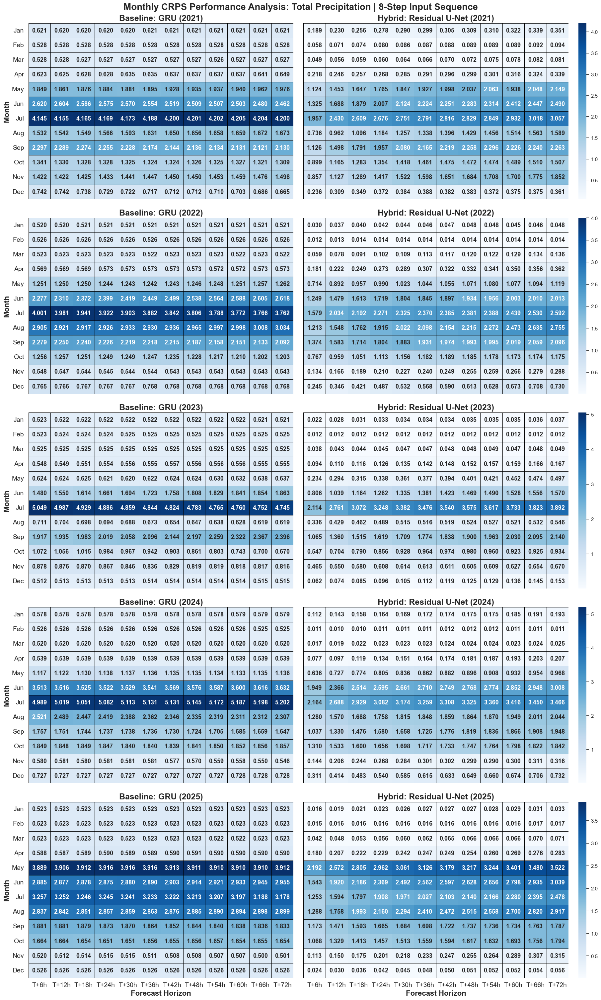

In [28]:
TPC.plot_crps_comparison_grids(
    predictions_by_horizon=predictions_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    sigmas_by_horizon=sigmas_by_horizon,
    X_test=X_test,
    baseline_model=gru_model,
    target_scaler=target_scaler,
    num_eval_samples=num_eval_samples,
    max_horizon=MAX_HORIZON,
    start_dt = datetime(2021, 1, 1),
    bs_md='GRU',
    unet_type='Residual',
    seq_len=SEQ_LEN,
    var_name='Total Precipitation',
    filepath='GRU_Residual_TP_CRPS_Monthly_8S.pdf'
)

### Forecast Uncertainty and Trajectory

In [29]:
importlib.reload(TPC);

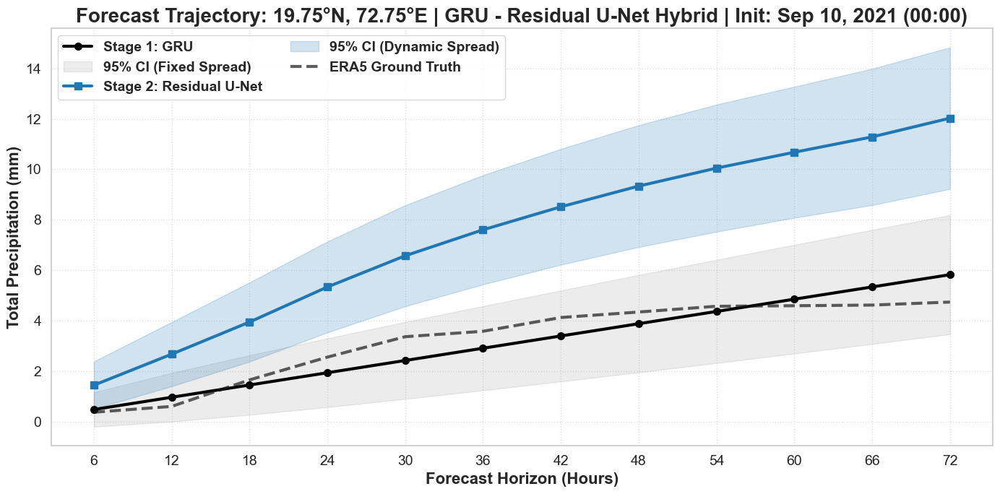

In [30]:
TPC.plot_forecast_trajectory(
    sample_start_idx=1000, 
    H=0, W=0, 
    predictions_by_horizon=predictions_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    sigmas_by_horizon=sigmas_by_horizon,
    X_test=X_test,
    baseline_model=gru_model,
    target_scaler=target_scaler,
    height=height,
    width=width,
    bs_md='GRU',
    unet_type='Residual',
    seq_len=SEQ_LEN,
    start_dt = datetime(2021, 1, 1),
    ytick_labels=ytick_labels,
    xtick_labels=xtick_labels,
    units='mm',
    var_name='Total Precipitation',
    filepath='GRU_Residual_TP_1000_00_FT_8S.pdf'
)

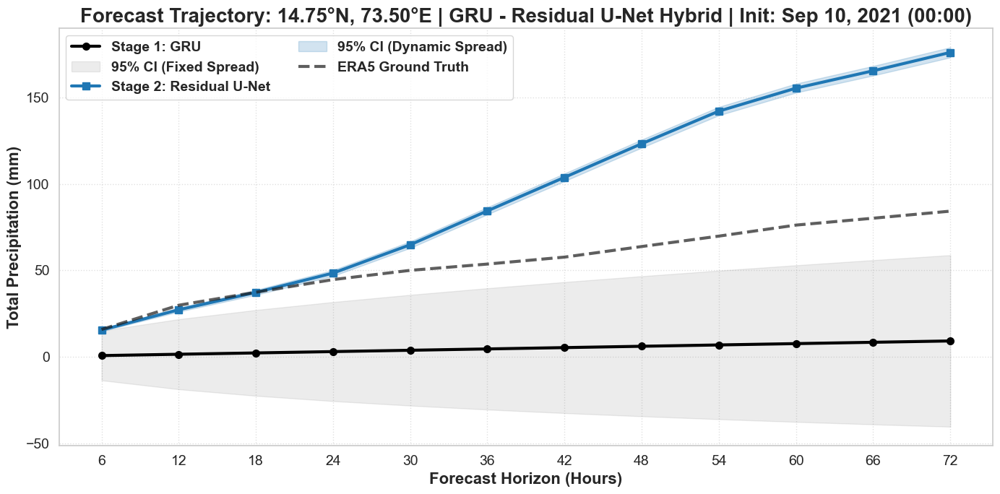

In [31]:
TPC.plot_forecast_trajectory(
    sample_start_idx=1000, 
    H=20, W=3, 
    predictions_by_horizon=predictions_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    sigmas_by_horizon=sigmas_by_horizon,
    X_test=X_test,
    baseline_model=gru_model,
    target_scaler=target_scaler,
    height=height,
    width=width,
    bs_md='GRU',
    unet_type='Residual',
    seq_len=SEQ_LEN,
    start_dt = datetime(2021, 1, 1),
    ytick_labels=ytick_labels,
    xtick_labels=xtick_labels,
    units='mm',
    var_name='Total Precipitation',
    filepath='GRU_Residual_TP_1000_203_FT_8S.pdf'
)

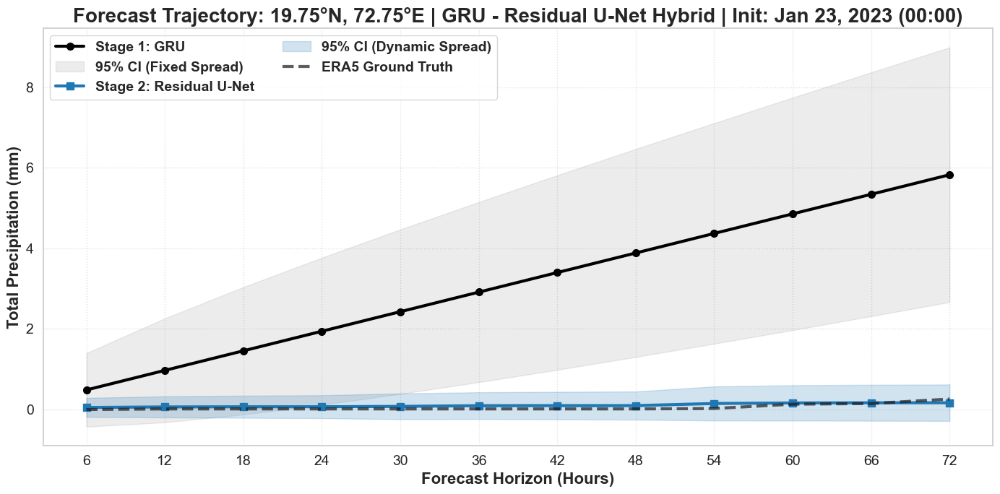

In [32]:
TPC.plot_forecast_trajectory(
    sample_start_idx=3000, 
    H=0, W=0, 
    predictions_by_horizon=predictions_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    sigmas_by_horizon=sigmas_by_horizon,
    X_test=X_test,
    baseline_model=gru_model,
    target_scaler=target_scaler,
    height=height,
    width=width,
    bs_md='GRU',
    unet_type='Residual',
    seq_len=SEQ_LEN,
    start_dt = datetime(2021, 1, 1),
    ytick_labels=ytick_labels,
    xtick_labels=xtick_labels,
    units='mm',
    var_name='Total Precipitation',
    filepath='GRU_Residual_TP_3000_00_FT_8S.pdf'
)

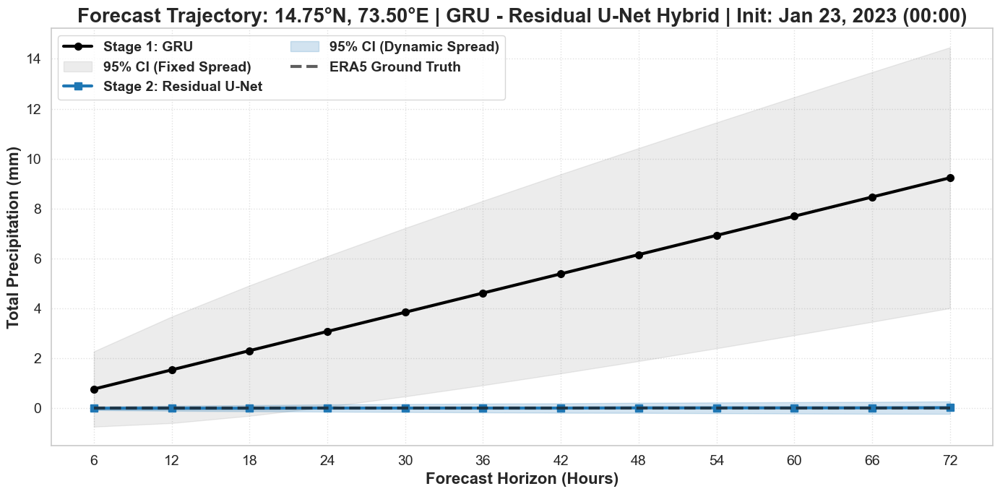

In [33]:
TPC.plot_forecast_trajectory(
    sample_start_idx=3000, 
    H=20, W=3, 
    predictions_by_horizon=predictions_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    sigmas_by_horizon=sigmas_by_horizon,
    X_test=X_test,
    baseline_model=gru_model,
    target_scaler=target_scaler,
    height=height,
    width=width,
    bs_md='GRU',
    unet_type='Residual',
    seq_len=SEQ_LEN,
    start_dt = datetime(2021, 1, 1),
    ytick_labels=ytick_labels,
    xtick_labels=xtick_labels,
    units='mm',
    var_name='Total Precipitation',
    filepath='GRU_Residual_TP_3000_203_FT_8S.pdf'
)

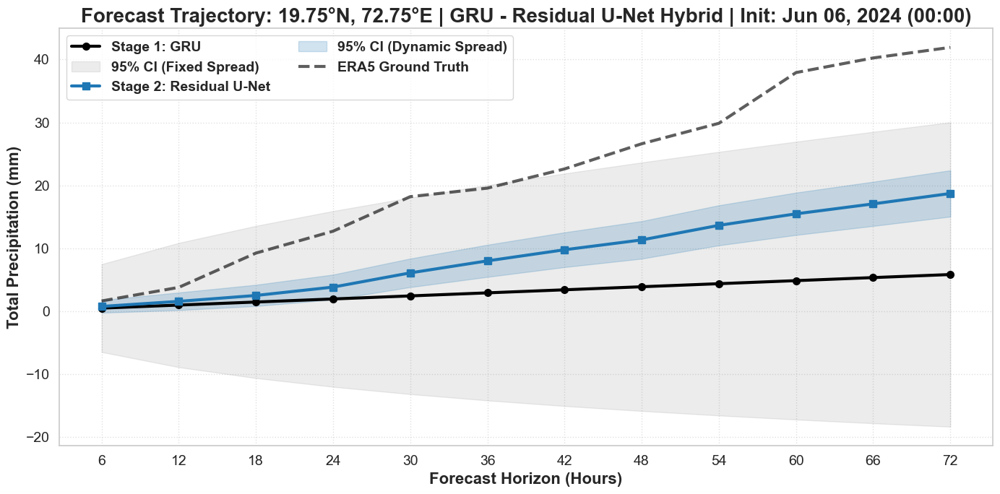

In [34]:
TPC.plot_forecast_trajectory(
    sample_start_idx=5000, 
    H=0, W=0, 
    predictions_by_horizon=predictions_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    sigmas_by_horizon=sigmas_by_horizon,
    X_test=X_test,
    baseline_model=gru_model,
    target_scaler=target_scaler,
    height=height,
    width=width,
    bs_md='GRU',
    unet_type='Residual',
    seq_len=SEQ_LEN,
    start_dt = datetime(2021, 1, 1),
    ytick_labels=ytick_labels,
    xtick_labels=xtick_labels,
    units='mm',
    var_name='Total Precipitation',
    filepath='GRU_Residual_TP_5000_00_FT_8S.pdf'
)

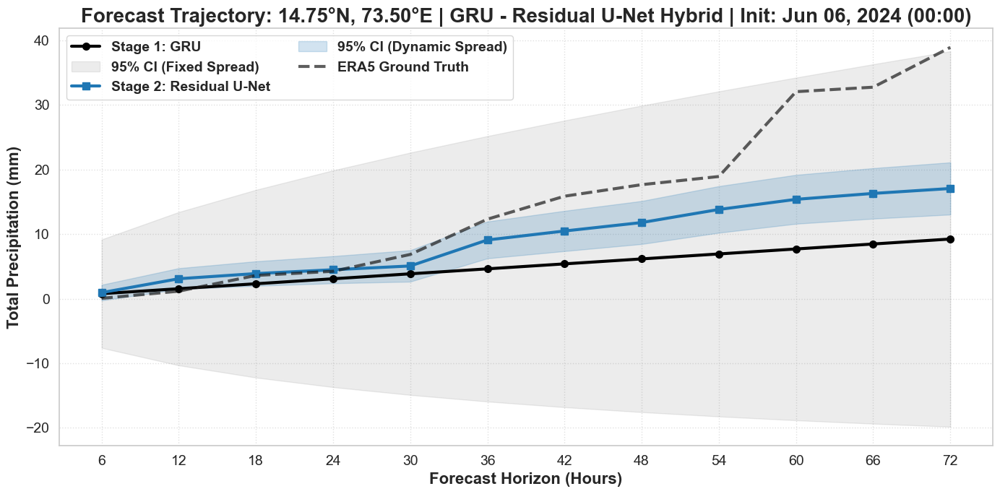

In [35]:
TPC.plot_forecast_trajectory(
    sample_start_idx=5000, 
    H=20, W=3, 
    predictions_by_horizon=predictions_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    sigmas_by_horizon=sigmas_by_horizon,
    X_test=X_test,
    baseline_model=gru_model,
    target_scaler=target_scaler,
    height=height,
    width=width,
    bs_md='GRU',
    unet_type='Residual',
    seq_len=SEQ_LEN,
    start_dt = datetime(2021, 1, 1),
    ytick_labels=ytick_labels,
    xtick_labels=xtick_labels,
    units='mm',
    var_name='Total Precipitation',
    filepath='GRU_Residual_TP_5000_203_FT_8S.pdf'
)

### Reliability Diagram for Probabilistic Forecasts

In [36]:
importlib.reload(TPC);

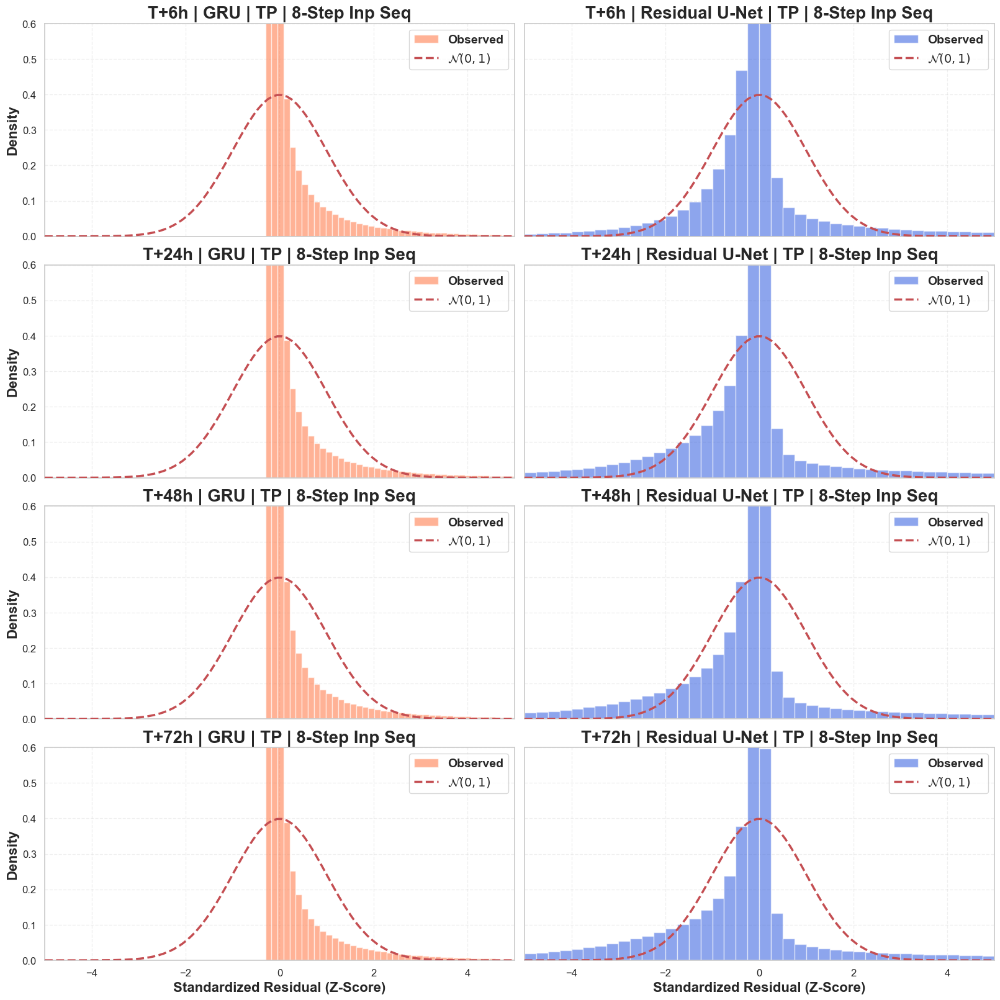

In [37]:
TPC.plot_comparative_reliability_diagrams(
    predictions_by_horizon=predictions_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    sigmas_by_horizon=sigmas_by_horizon,
    X_test=X_test,
    tar_hor = [1, 4, 8, 12],
    baseline_model=gru_model,
    target_scaler=target_scaler,
    bs_md='GRU',
    unet_type='Residual',
    var_name='Total Precipitation',
    vn='TP',
    seq_len=SEQ_LEN,
    filepath='RBPF_GRU_Residual_TP_6,24,48,72h_8S.pdf'
)

### Spatial Bias Analysis

In [38]:
importlib.reload(TPC);

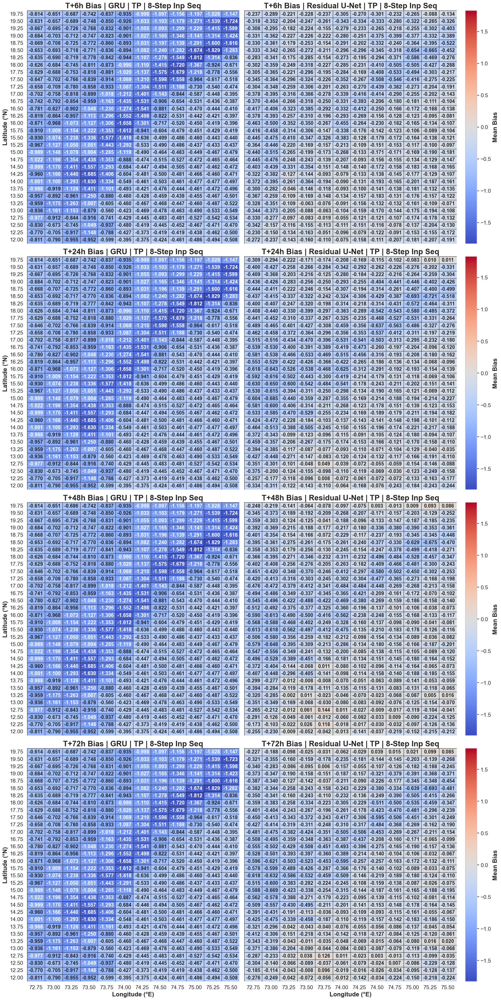

In [39]:
TPC.plot_spatial_bias_comparison(
    seq_len=SEQ_LEN,
    predictions_by_horizon=predictions_by_horizon,
    ground_truth_by_horizon=ground_truth_by_horizon,
    X_test=X_test,
    tar_hor = [1, 4, 8, 12],
    baseline_model=gru_model,
    target_scaler=target_scaler,
    height=height,
    width=width,
    xtick_labels=xtick_labels,
    ytick_labels=ytick_labels,
    bs_md='GRU',
    unet_type='Residual',
    var_name='Total Precipitation',
    vn='TP',
    filepath='GRU_Residual_TP_6,24,48,72h_SBC_8S.pdf'
)

***